<a href="https://colab.research.google.com/github/merongedrago/Explainable_Deep_Learning/blob/main/explainable_deep_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install kagglehub
!pip install torch
import pandas as pd
import matplotlib.pyplot as plt
import kagglehub
import torch
from torchvision.models import resnet50, ResNet50_Weights

# Download latest version
path = kagglehub.dataset_download("mdwaquarazam/agricultural-crops-image-classification")

print("Path to dataset files:", path)


100%|██████████| 79.0M/79.0M [00:01<00:00, 81.9MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mdwaquarazam/agricultural-crops-image-classification/versions/1


In [3]:
# look at the first few labels of the datset
import os
agri_data = path +"/Agricultural-crops/"
Crops_label = sorted(os.listdir(agri_data))
Crops_label[:5]


['Cherry', 'Coffee-plant', 'Cucumber', 'Fox_nut(Makhana)', 'Lemon']

In [4]:
count_Crops_image = [len(os.listdir(os.path.join(agri_data + label))) for label in Crops_label]
Crops_image_df = pd.DataFrame({'Crops_label':Crops_label, 'count_Crops_image':count_Crops_image})
print(Crops_image_df.shape)
Crops_image_df.head()

(30, 2)


,Crops_label,count_Crops_image
0,Cherry,32
1,Coffee-plant,29
2,Cucumber,31
3,Fox_nut(Makhana),23
4,Lemon,28


In [5]:
import pathlib
from glob import glob
data_dir = pathlib.Path(path)

In [6]:
import cv2

def read_image(path):
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

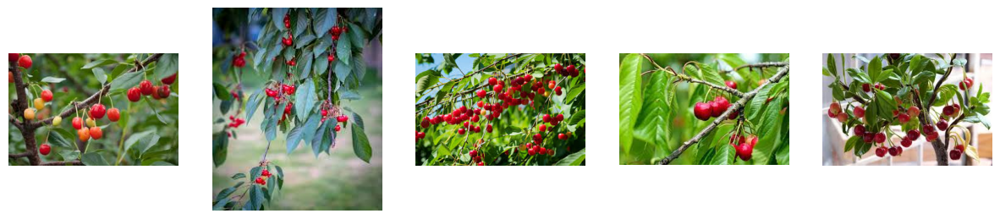

Cherry


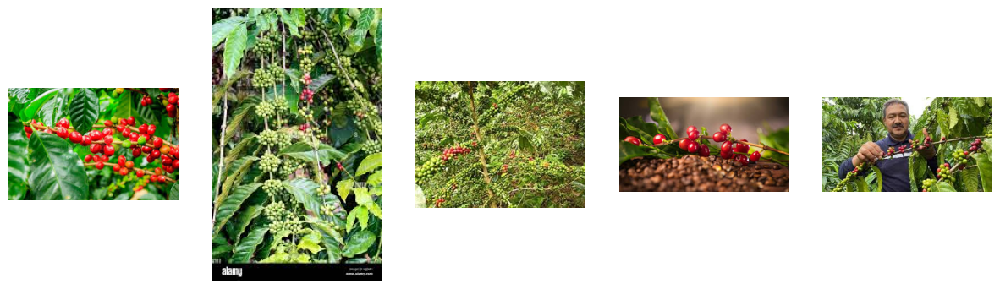

Coffee-plant


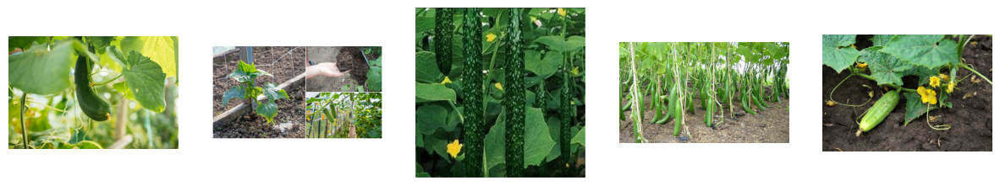

Cucumber


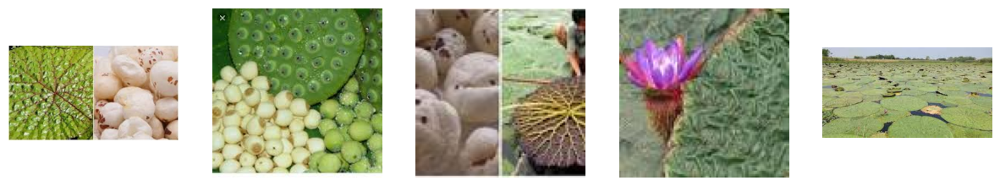

Fox_nut(Makhana)


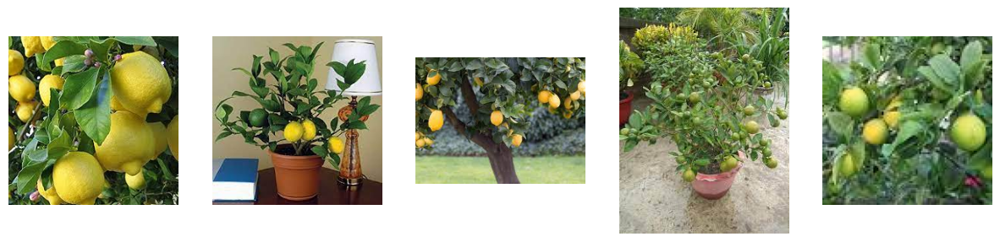

Lemon


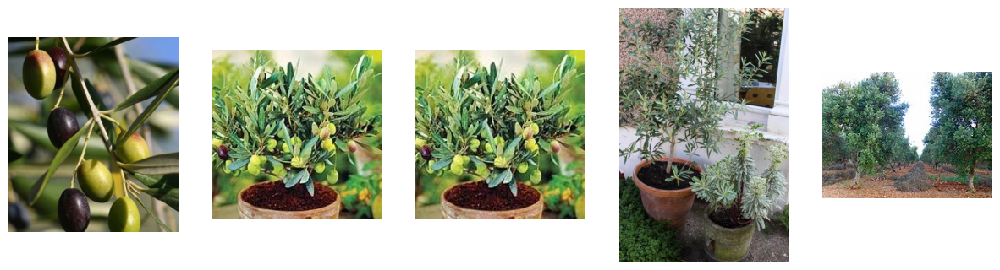

Olive-tree


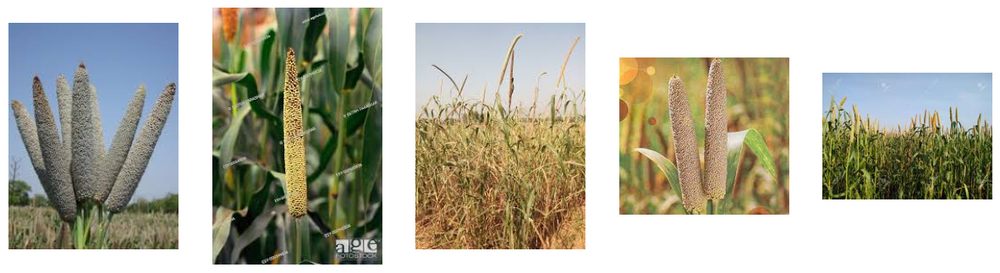

Pearl_millet(bajra)


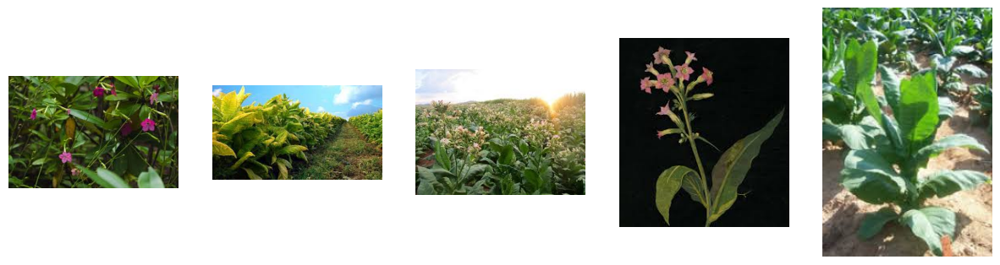

Tobacco-plant


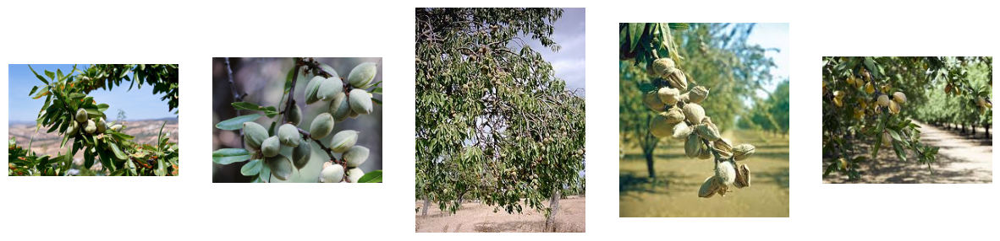

almond


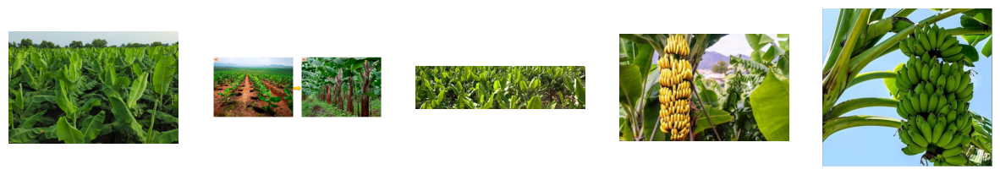

banana


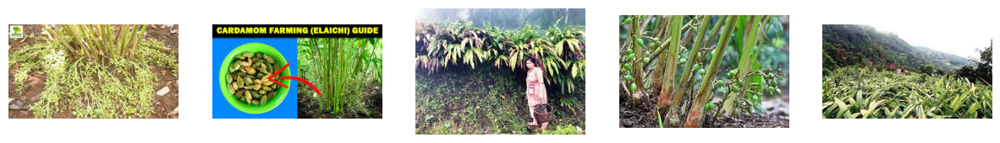

cardamom


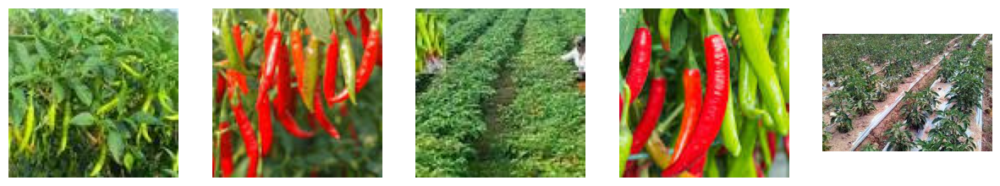

chilli


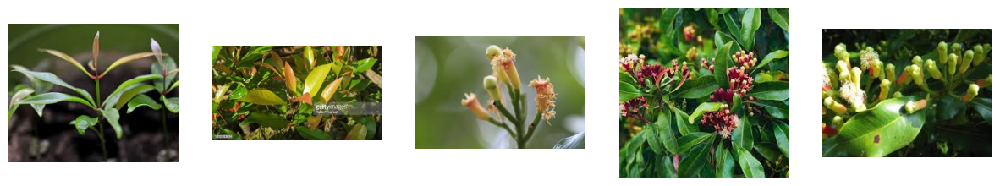

clove


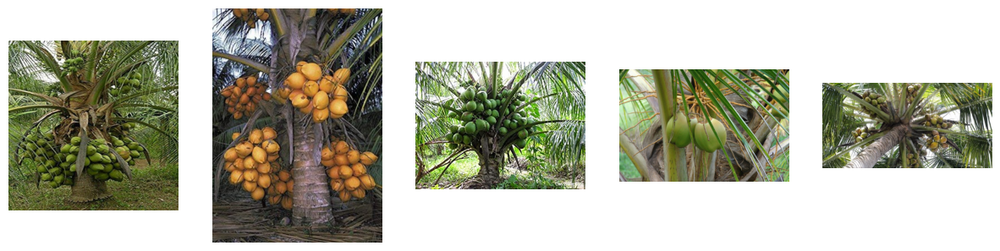

coconut


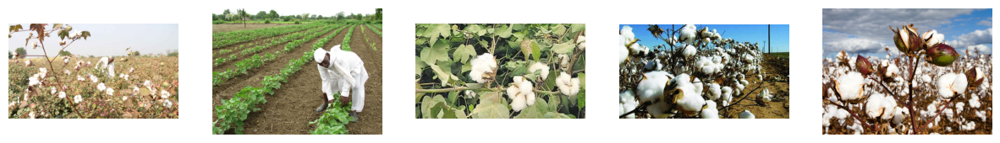

cotton


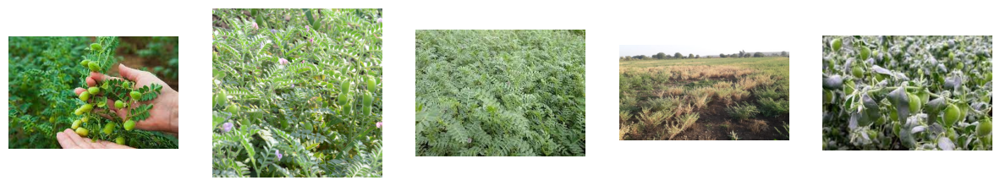

gram


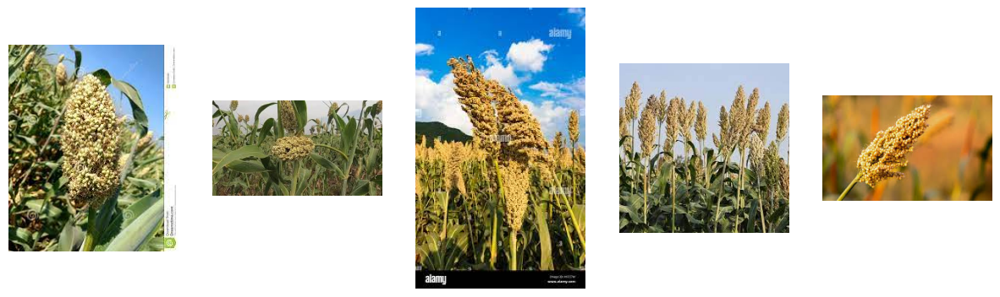

jowar


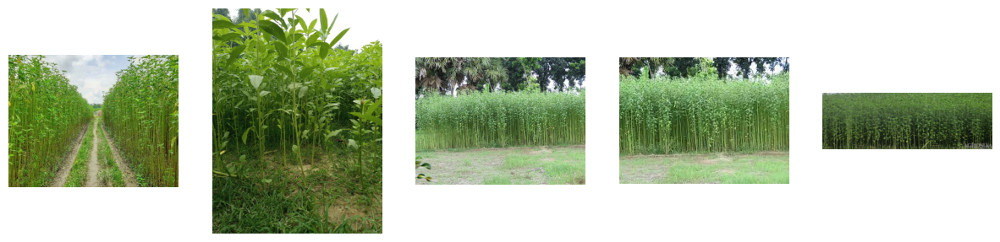

jute


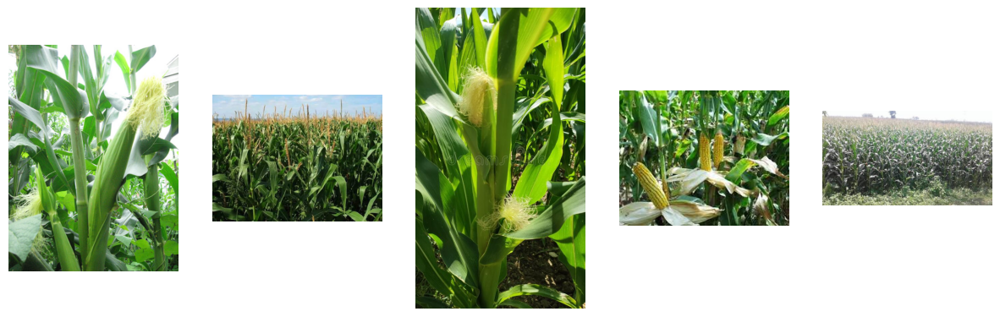

maize


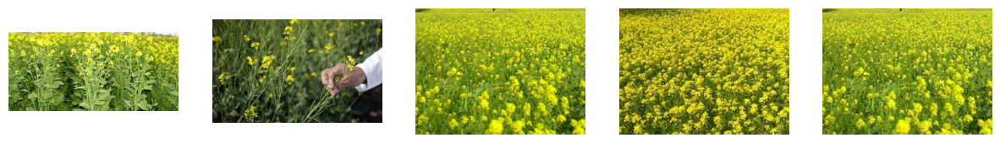

mustard-oil


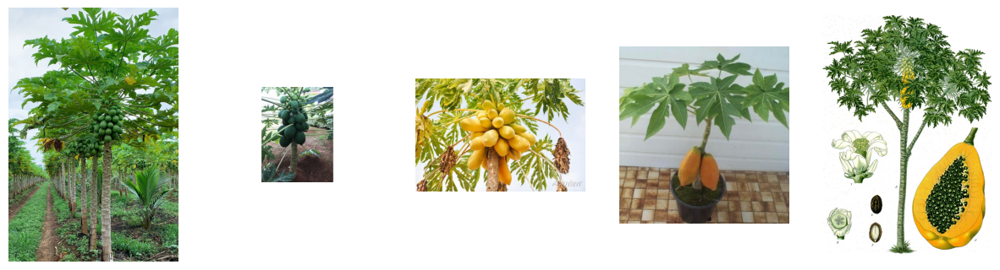

papaya


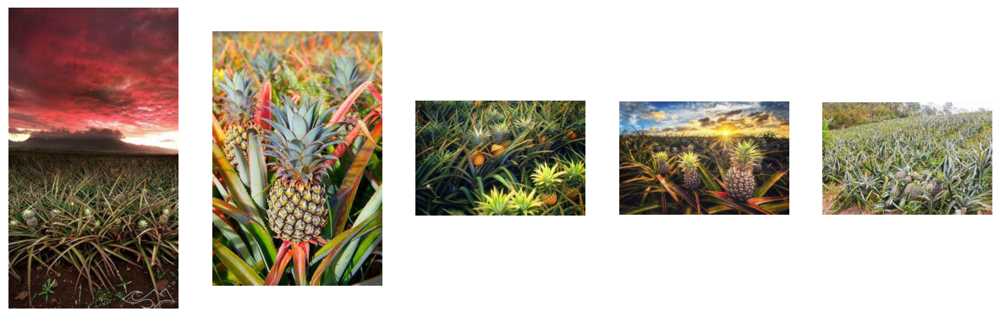

pineapple


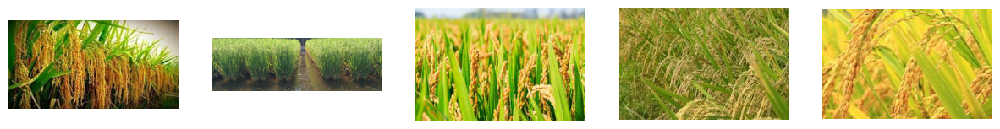

rice


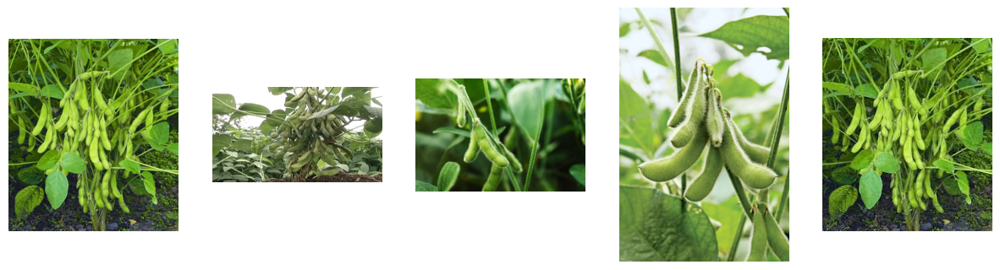

soyabean


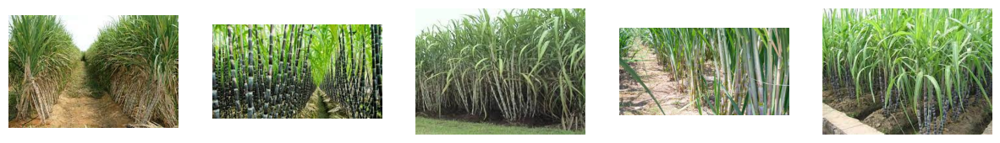

sugarcane


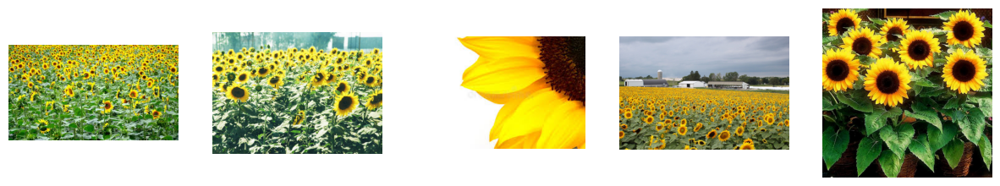

sunflower


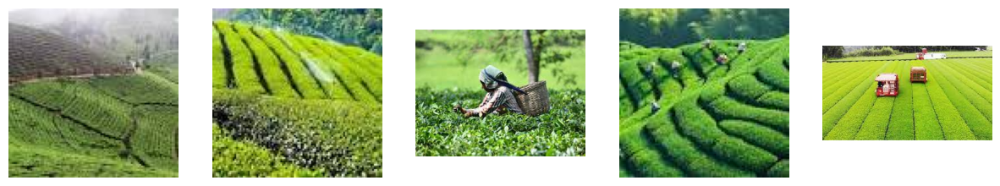

tea


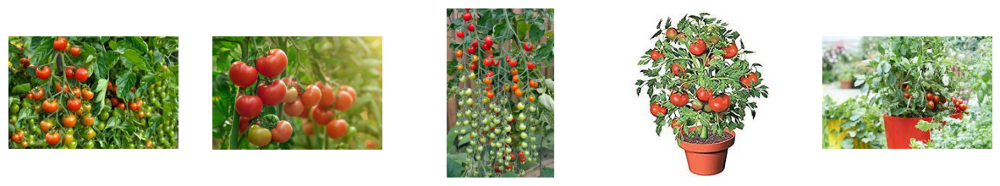

tomato


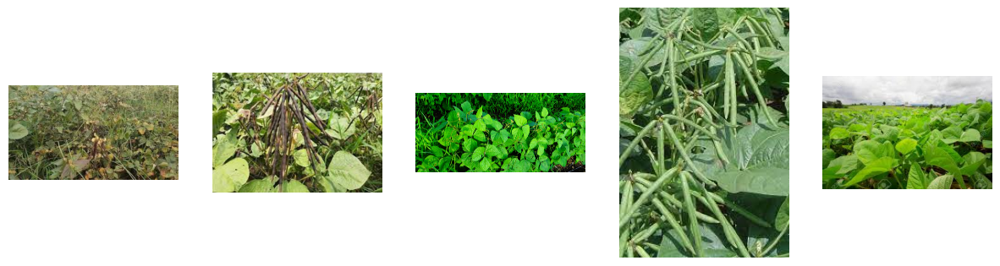

vigna-radiati(Mung)


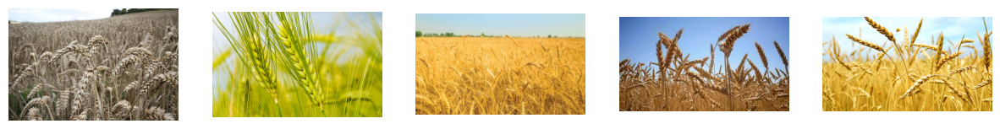

wheat


In [7]:
for label in Crops_label:
    f, ax = plt.subplots(figsize=(15,15))
    files = glob('{}/Agricultural-crops/{}/*.*'.format(data_dir, label))
    ax.remove()

    for x in range(5):
        plt.subplot(1, 5, x+1)
        image = read_image(files[x])
        plt.imshow(image)
        plt.axis('off')

    plt.show()
    print(label)

In [16]:
# Intialize Generator
!pip install tensorflow
# Correcting the import statement for ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator as ImgDataGen

gen = ImgDataGen(rescale=1./255, rotation_range=20, horizontal_flip=True, validation_split=0.1)

# Load Data
train_ds = gen.flow_from_directory(agri_data,
                                   class_mode='binary', shuffle=True,
                                   batch_size=32, target_size=(256,256), subset='training')
valid_ds = gen.flow_from_directory(agri_data,
                                   class_mode='binary', shuffle=True,
                                   batch_size=32, target_size=(256,256), subset='validation')

Found 757 images belonging to 30 classes.
Found 72 images belonging to 30 classes.


In [17]:
from tensorflow.keras.applications import ResNet50V2, InceptionV3, Xception # pre-Trained Learning Model
from tensorflow.keras.applications.vgg16 import VGG16 # pre-Trained Learning Model
from keras.models import Sequential
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint

# load ResNet50V2 for Transfer Learning
base_model = ResNet50V2(weights='imagenet', include_top = False, input_shape=(256,256,3))
base_model.trainable = False

#base_model.summary()

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [18]:
# Model Architecture
model = Sequential([base_model,
                    GAP(),
                    Dense(1024, activation='relu'),
                    Dropout(0.5),
                    Dense(1024, activation='relu'),
                    Dropout(0.5),
                    Dense(len(Crops_label), activation='softmax')], name="ResNet50V2")

# Compile Model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.summary()

Model: "ResNet50V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50v2 (Functional)         │ (None, 8, 8, 2048)     │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 30)             │        30,750 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,743,326 (102.02 MB)

 Trainable params: 3,178,526 (12.13 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

In [19]:
# Callbacks
cbs = [EarlyStopping(patience=3, restore_best_weights=True)]

# Model Training
history = model.fit(train_ds, validation_data=valid_ds, epochs=10, callbacks=cbs)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.1071 - loss: 3.5436 - val_accuracy: 0.5000 - val_loss: 2.0448
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 623ms/step - accuracy: 0.4728 - loss: 1.9346 - val_accuracy: 0.5417 - val_loss: 1.4854
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 627ms/step - accuracy: 0.5910 - loss: 1.3189 - val_accuracy: 0.6389 - val_loss: 1.3198
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 631ms/step - accuracy: 0.6449 - loss: 1.1695 - val_accuracy: 0.6528 - val_loss: 1.2132
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 16s 657ms/step - accuracy: 0.7415 - loss: 0.8326 - val_accuracy: 0.6528 - val_loss: 1.2911
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 18s 767ms/step - accuracy: 0.7850 - loss: 0.6942 - val_accuracy: 0.7083 - val_loss: 1.0433
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 625ms/step - accuracy: 0.8139 - loss: 0.6027 - val_accuracy: 0.7083 - val_loss: 1.1670
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 16s 672ms/step - accuracy: 0.8582 - loss: 0.4783 - val_accurac

Text(0.5, 1.0, 'Accuracy Vs Epoch')

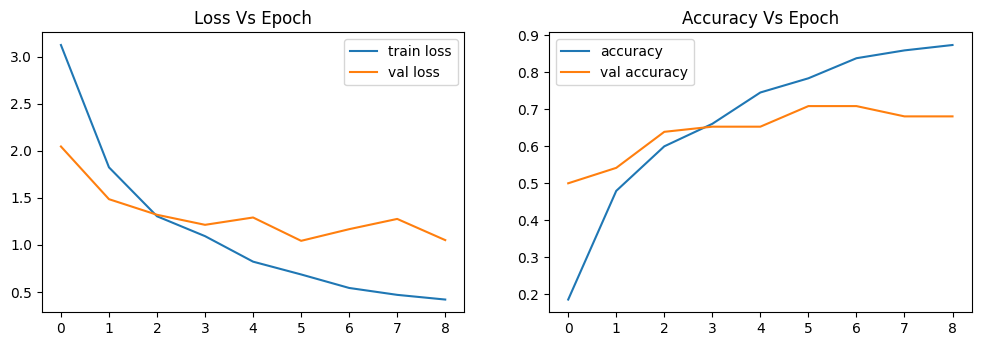

In [20]:
# plot loss and accuracy Vs Epoch

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.legend()
plt.title('Loss Vs Epoch')

plt.subplot(2, 2, 2)
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.legend()
plt.title('Accuracy Vs Epoch')

In [25]:
!pip install grad-cam
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50

# model = resnet50(pretrained=True)
target_layers = model.layers[]
input_tensor = train_ds # Create an input tensor image for your model..
# Note: input_tensor can be a batch tensor with several images!

# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers)

# You can also use it within a with statement, to make sure it is freed,
# In case you need to re-create it inside an outer loop:
# with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
#   ...

# We have to specify the target we want to generate
# the Class Activation Maps for.
# If targets is None, the highest scoring category
# will be used for every image in the batch.
# Here we use ClassifierOutputTarget, but you can define your own custom targets
# That are, for example, combinations of categories, or specific outputs in a non standard model.

targets = [ClassifierOutputTarget(281)]

# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# In this example grayscale_cam has only one image in the batch:
grayscale_cam = grayscale_cam[0, :]
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

AttributeError: 'Sequential' object has no attribute 'eval'